# Imports

In [1]:
import imageio
import numpy as np
import pandas as pd
import scanpy as sc
import squidpy as sq
import matplotlib.pyplot as plt
import os
from pathlib import Path
import seaborn as sns
import warnings

In [2]:
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
data_dir = Path('/Users/I0552341/Desktop/Visium_PP_paper/Visium_PP/')
output_dir = Path('/Users/I0552341/Desktop/Visium_PP_paper/Visium_PP/outputs')

# Visium

## Data Load

High resolution Visium image load

In [4]:
hires = Path(f'{data_dir}/Visium_data/spatial/tissue_hires_image.png')
hires = imageio.imread(hires)

/var/folders/93/hynykrw17h11dc4rh59547700000gp/T/ipykernel_72025/2865871368.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  hires = imageio.imread(hires)


Visium adata object creation

In [5]:
vis_dir = Path(f'{data_dir}/Visium_data')

adata = sc.read_visium(
    vis_dir,
    count_file='raw/raw_feature_bc_matrix.h5',
    library_id=None,
    load_images=True,
    source_image_path=os.path.join(vis_dir, 'spatial/tissue_hires_image.png')
)

adata.var_names_make_unique()

In [6]:
adata

AnnData object with n_obs × n_vars = 4991 × 37082
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

## Preprocessing

Filtering and preprocessing

In [7]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")

In [10]:
#adata.var["mt"] = adata.var_names.str.startswith("MT-")
#sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

sc.pp.filter_cells(adata, min_counts=4000)
sc.pp.filter_cells(adata, max_counts=90000)

#adata = adata[adata.obs["pct_counts_mt"] < 40].copy()
#print(f"#spots after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

/opt/homebrew/Caskroom/miniconda/base/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


## Spots overlay

Scalefactors retrieval

In [11]:
vis_scalefs = adata._uns['spatial']['19h1257-1-PP-v2']['scalefactors']

# High resolution image scalefactor
sf = vis_scalefs['tissue_hires_scalef']
# Spot diameter scalefactor
spot_diam = vis_scalefs['spot_diameter_fullres']

Scaled spot coordinates extraction

<Axes: >

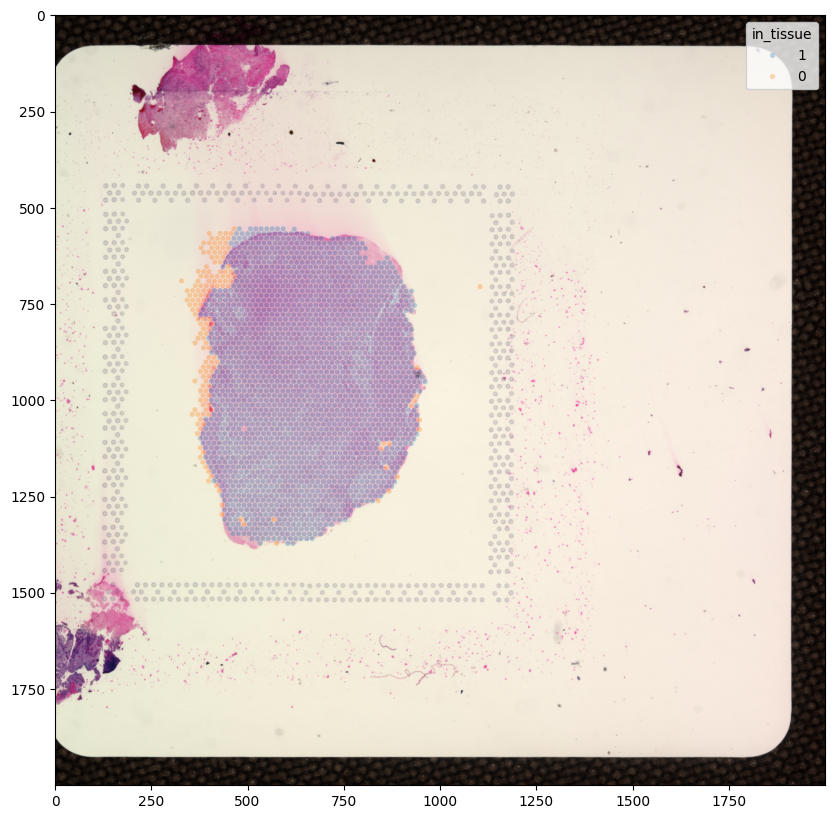

In [22]:
# Convert adata.obsm['spatial'] to a numpy array of floats
spatial_data = adata.obsm['spatial'].astype(float)

# Perform the multiplication
spot_x = spatial_data[:, 0] * sf
spot_y = spatial_data[:, 1] * sf

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Display the high-resolution image
ax.imshow(hires)

# Plot the scatter plot
sns.scatterplot(x=spot_x, y=spot_y, ax=ax, s=spot_diam, alpha=0.3, hue=adata.obs['in_tissue'])

## Preprocessing
Grayscaling, masking by the chosen signal threshold

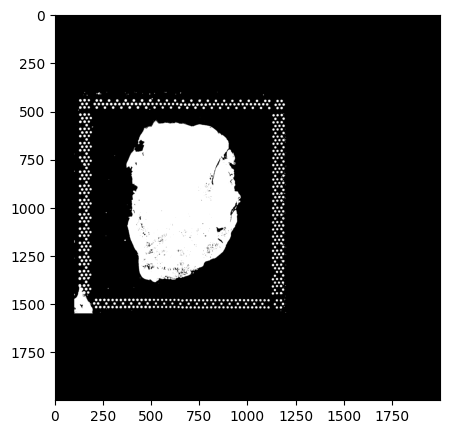

In [23]:
hires_gray = hires.mean(axis=2)
hires_gray.shape

y1, y2 = 400, 1550
x1, x2 = 100, 1200

hires_mask = hires_gray < 215
hires_mask[0:y1,:] = 0
hires_mask[y2:,:] = 0
hires_mask[:,:x1] = 0
hires_mask[:,x2:] = 0

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(hires_mask, cmap='gray')

Cropping into the area of interest

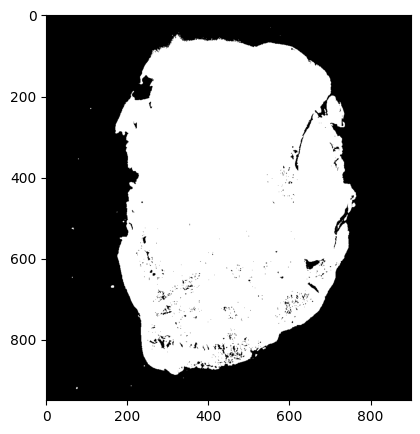

In [24]:
margin = 100

y1, y2 = y1 + margin, y2 - margin
x1, x2 = x1 + margin, x2 - margin

hires_mask_cropped = hires_mask[y1:y2, x1:x2]
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(hires_mask_cropped, cmap='gray')

Use Downscaling if needed

<Axes: >

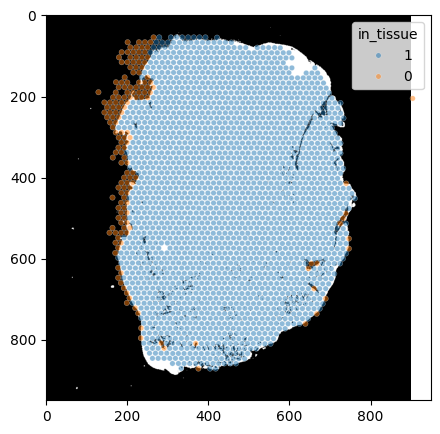

In [25]:
from skimage.measure import block_reduce

vis_downscale_factor = 1

mask_downsampled =  block_reduce(hires_mask_cropped, block_size=vis_downscale_factor, func=np.mean, cval=0, func_kwargs=None)
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(hires_mask_cropped, cmap='gray')
sns.scatterplot(x=(spot_x - x1) / vis_downscale_factor, y=(spot_y - y1) / vis_downscale_factor, ax = ax, s=spot_diam, alpha=0.5, hue=adata.obs['in_tissue'])

# PP

## Data Load

In [27]:
from pyometiff import OMETIFFReader

pp_cropped = 'pp_orig_cropped.tif'

cropped_img_fpath = os.path.join(data_dir, pp_cropped)
reader = OMETIFFReader(fpath=cropped_img_fpath)

pp_cropped, metadata, xml_metadata = reader.read()
pp_cropped.shape

Key not found: list index out of range
Key not found: list index out of range
key not found list index out of range
Key not found: list index out of range


(34, 9342, 13197)

## Image preprocessing

Grayscale transformation and downsampling

In [28]:
from skimage.measure import block_reduce

block_size=15

pp_cropped_gray = pp_cropped.mean(axis=0).T

pp_cropped_gray =  block_reduce(pp_cropped_gray, block_size=block_size, func=np.mean, cval=0, func_kwargs=None)
pp_cropped_gray.shape

(880, 623)

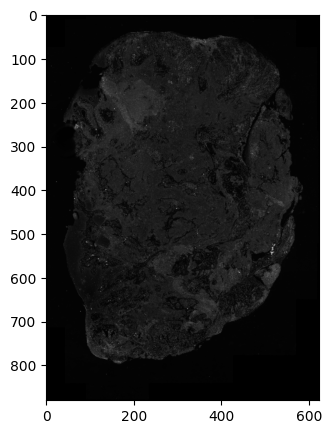

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(pp_cropped_gray, cmap='gray')

Signal intensity masking

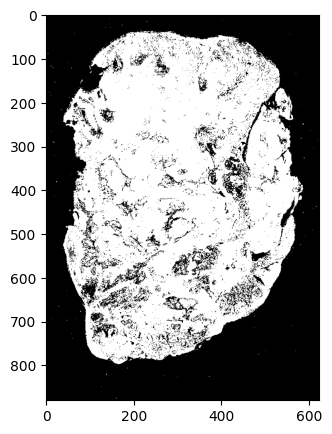

In [30]:
pp_cropped_mask = pp_cropped_gray > 130
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(pp_cropped_mask, cmap='gray')

# Alignment procedure

## Image centre mass identification

From the coordinates of the masked image we can can infer the center of mass of a masked object. The center of the Visium image should match with the Phenocycler image, so it is being used for the first step of alignment

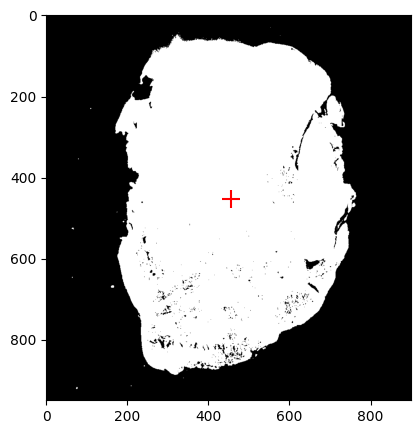

In [31]:
from skimage.measure import regionprops

center_of_mass_visium = regionprops(hires_mask_cropped.astype(int))[0].centroid

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(hires_mask_cropped, cmap='gray')
ax.scatter(center_of_mass_visium[1], center_of_mass_visium[0], s=160, c='r', marker='+')
plt.show()

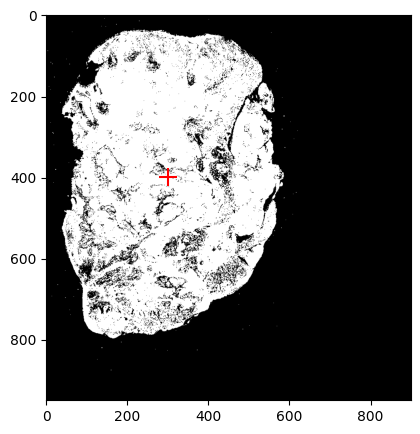

In [32]:
pp_padded = np.zeros_like(hires_mask_cropped)

pp_padded[:pp_cropped_mask.shape[0],:pp_cropped_mask.shape[1]] = pp_cropped_mask

center_of_mass_pp = regionprops(pp_padded.astype(int))[0].centroid

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(pp_padded, cmap='gray')
ax.scatter(center_of_mass_pp[1], center_of_mass_pp[0], s=160, c='r', marker='+')
plt.show()

## Scaling factor identification

This step is straightforward when the original resolutions of both 1) Visium microscopy image and 2) PhenoCycler output image are known. Otherwise the scaling factor between two images has to be inferred. Current approach is comparison of the largest pixel distances within the sample masks. This approach is imapplicable to images that lack central symmetry

This coarsely identified scaling factor is just a first step for downstream optimisation.

In [33]:
from scipy.spatial.distance import cdist
def get_distances(img):
    points = np.moveaxis(np.indices(img.shape),0,-1).reshape(-1,2)
    points = points[img.reshape(-1,1).squeeze()]
    distances = cdist(points, points, 'euclidean')

    np.fill_diagonal(distances, 0)
    print(distances.shape)

    max_distance = np.max(distances)
    max_ids = np.argmax(distances)
    max_ids = np.unravel_index(max_ids, distances.shape)
    max_points = points[max_ids, :]

    return max_distance, max_points

In [34]:
from skimage import transform as tf


transform = tf.AffineTransform(scale=0.15)

pp_transformed_downscaled = tf.warp(pp_padded, transform.inverse)
hires_mask_cropped_downscaled = tf.warp(hires_mask_cropped, transform.inverse)

d1, id1 = get_distances(pp_transformed_downscaled)
d2, id2 = get_distances(hires_mask_cropped_downscaled)

ratio = d1 / d2
ratio

(6445, 6445)
(8503, 8503)


0.9196127085689273

Visual comparison of identified points with a largest distance between them within the masked images

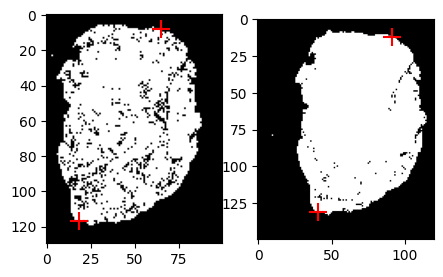

In [35]:
fig, ax = plt.subplots(1, 2, figsize=(5, 5))

ax[0].imshow(pp_transformed_downscaled[:130,:100], cmap='gray')
ax[0].scatter(id1[0][1], id1[0][0], s=160, c='r', marker='+')
ax[0].scatter(id1[1][1], id1[1][0], s=160, c='r', marker='+')

ax[1].imshow(hires_mask_cropped_downscaled[:150,:120], cmap='gray')
ax[1].scatter(id2[0][1], id2[0][0], s=160, c='r', marker='+')
ax[1].scatter(id2[1][1], id2[1][0], s=160, c='r', marker='+')

Scaling by the identified factor and shifting to match centre masses of two masked images

In [36]:
from skimage import transform as tf

def stepwise_transform(pp_padded, ratio, center_of_mass_visiumo, shift_term=None):
    transform = tf.AffineTransform(scale=1 / ratio)
    pp_transformed = tf.warp(pp_padded, transform.inverse)

    center_of_mass_pp = regionprops(pp_transformed.astype(int))[0].centroid

    if shift_term is None:
        diff = np.array(center_of_mass_pp) - np.array(center_of_mass_visium)
    else:
        diff = np.array(center_of_mass_pp) - np.array(center_of_mass_visium) + np.array(shift_term)

    transform = tf.AffineTransform(scale=1 , translation=[-diff[1], -diff[0]])
    pp_transformed = tf.warp(pp_transformed, transform.inverse)

    return pp_transformed, diff

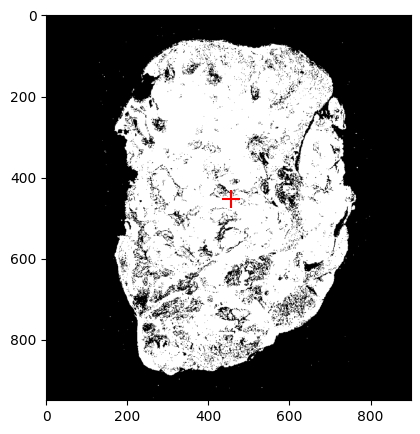

In [37]:
pp_transformed, diff = stepwise_transform(pp_padded, ratio, center_of_mass_visium)
center_of_mass_pp_transformed = regionprops(pp_transformed.astype(int))[0].centroid

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(pp_transformed, cmap='gray')
ax.scatter(center_of_mass_pp_transformed[1], center_of_mass_pp_transformed[0], s=160, c='r', marker='+')

Preliminary alignment results

In [38]:
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

def plot_alignment(pp_transformed, hires_mask_cropped):
    # Calculate sum and diff mismatch matrices
    sm = pp_transformed.astype(int) + hires_mask_cropped.astype(int)
    mm = pp_transformed.astype(int) - hires_mask_cropped.astype(int)
    
    center_of_mass_pp_transformed = regionprops(pp_transformed.astype(int))[0].centroid
    
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    
    # Plot the sum matrix with center of mass
    ax[0].imshow(sm, cmap='gray')
    ax[0].scatter(center_of_mass_pp_transformed[1], center_of_mass_pp_transformed[0], s=160, c='r', marker='+')
    ax[0].set_title('Aligned Image Overlay')
    ax[0].axis('off')
    
    # Plot the sum matrix
    colors = ['black', 'red', 'blue']
    custom_cmap = ListedColormap(colors)
    ax[1].imshow(sm, cmap=custom_cmap)
    legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(colors[1:], ['Mismatch', 'Match'])]
    ax[1].legend(handles=legend_patches, loc='lower right')
    ax[1].set_title('Mismatch Matrix')
    ax[1].axis('off')
    
    # Plot the difference matrix
    ax[2].imshow(mm, cmap='gray')
    legend_elements = [
        mpatches.Patch(color='black', label='PhenoCycler'),
        mpatches.Patch(color='gray', label='Match'),
        mpatches.Patch(color='white', label='Visium')
    ]
    ax[2].legend(handles=legend_elements, loc='lower right')
    ax[2].set_title('Difference Matrix')
    ax[2].axis('off')
    
    plt.tight_layout()
    plt.show()


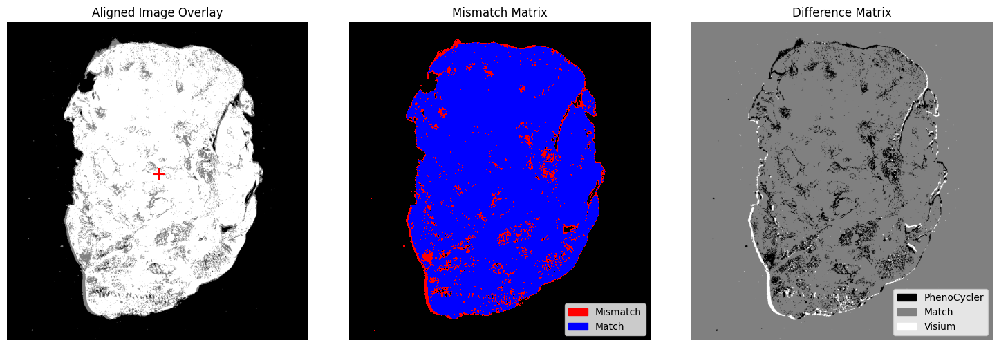

In [39]:
plot_alignment(pp_transformed, hires_mask_cropped)

## Grid search optimisation

Using the identified parameters as a baseline, we implement a downstream grid-search optimization:

In [40]:
def scaling_picker_func(pp_padded, center_of_mass_visium, hires_mask_cropped, ratio, shift_term):
    pp_transformed, diff = stepwise_transform(pp_padded, ratio, center_of_mass_visium, shift_term)

    sm = pp_transformed.astype(int) + hires_mask_cropped.astype(int)
    mismatch = (sm == 1).sum()
    match = (sm != 1).sum()

    return mismatch / (match + mismatch)

In [41]:
def scaling_picker_func1(pp_padded, center_of_mass_visium, hires_mask_cropped, ratio, shift_term):
    pp_transformed, diff = stepwise_transform(pp_padded, ratio, center_of_mass_visium, shift_term)

    mm = pp_transformed.astype(int) - hires_mask_cropped.astype(int)
    return ((mm == 1).sum() +  (mm == -1).sum()) / 2

In [42]:
def safe_multiplication_with_log(mm):
    pos_count = (mm == 1).sum()
    neg_count = (mm == -1).sum()
    if pos_count == 0 or neg_count == 0:
        return 0
    return np.exp((np.log(pos_count) + np.log(neg_count)) / 2)

def scaling_picker_func2(pp_padded, center_of_mass_visium, hires_mask_cropped, ratio, shift_term):
    pp_transformed, diff = stepwise_transform(pp_padded, ratio, center_of_mass_visium, shift_term)
    mm = pp_transformed.astype(int) - hires_mask_cropped.astype(int)
    return safe_multiplication_with_log(mm)

In [43]:
from tqdm.notebook import tqdm

Xs,Ys = np.mgrid[-1:7:1, -4:5:1]
xy = np.vstack((Xs.flatten(), Ys.flatten())).T

scale_grid = np.linspace(.91, .93, 20)

d = []

for rat in tqdm(scale_grid):
    for shift_term in xy:
        res = scaling_picker_func1(pp_padded, center_of_mass_visium, hires_mask_cropped, rat, shift_term)
        d.append([rat, shift_term[0], shift_term[1], res])

res1 = pd.DataFrame(d, columns=['ratio', 'x', 'y', 'score'])

  0%|          | 0/20 [00:00<?, ?it/s]

<Axes: xlabel='ratio', ylabel='score'>

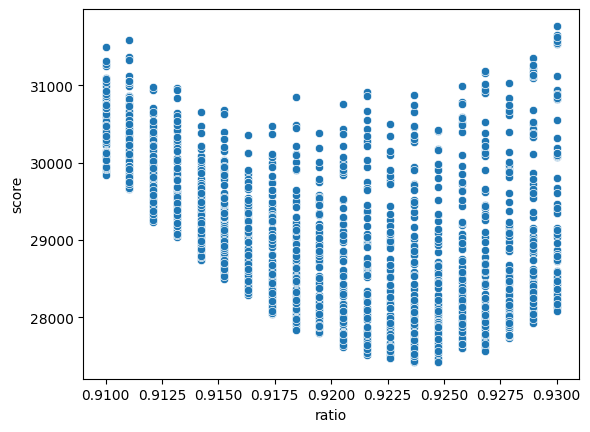

In [44]:
sns.scatterplot(res1, x='ratio', y='score')

In [45]:
from tqdm.notebook import tqdm

Xs,Ys = np.mgrid[-1:7:1, -4:5:1]
xy = np.vstack((Xs.flatten(), Ys.flatten())).T

scale_grid = np.linspace(.91, .96, 5)

d = []

for rat in tqdm(scale_grid):
    for shift_term in xy:
        res = scaling_picker_func2(pp_padded, center_of_mass_visium, hires_mask_cropped, rat, shift_term)
        d.append([rat, shift_term[0], shift_term[1], res])

res2 = pd.DataFrame(d, columns=['ratio', 'x', 'y', 'score'])

  0%|          | 0/5 [00:00<?, ?it/s]

No grid search optimisation

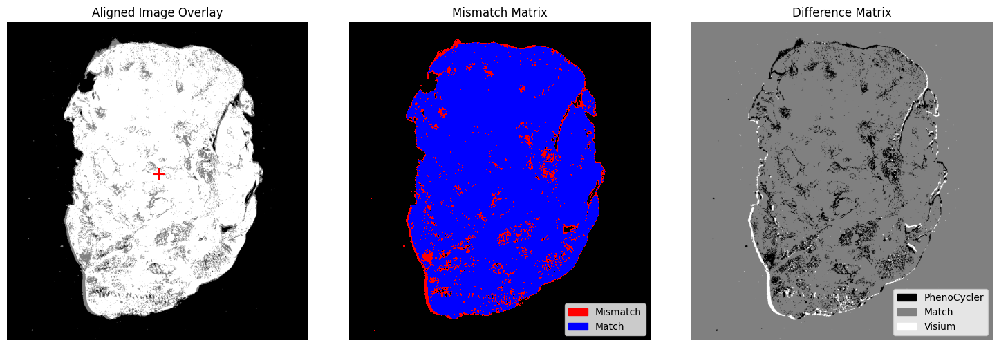

In [46]:
pp_transformed, diff = stepwise_transform(pp_padded, ratio, center_of_mass_visium)
plot_alignment(pp_transformed, hires_mask_cropped)

Grid search optimisation for the lowest number of mismatch pixels

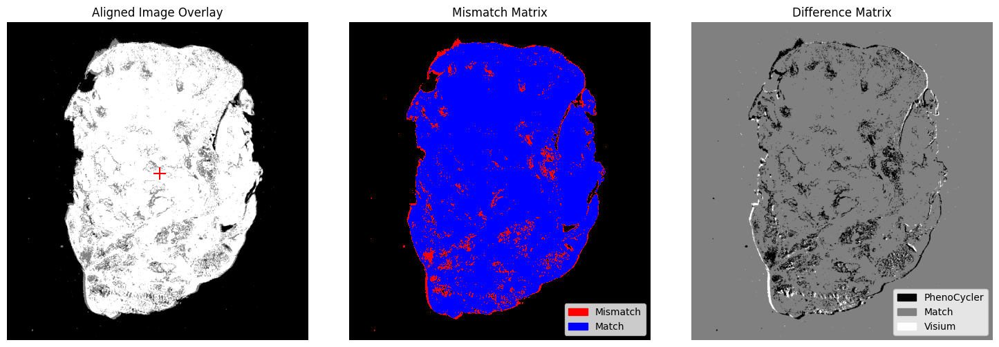

In [47]:
best_ratio1 = res1.sort_values('score').iloc[0]['ratio']
best_shift_term1 = res1.sort_values('score')[['x', 'y']].iloc[0].values

pp_transformed1, diff1 = stepwise_transform(pp_padded, best_ratio1, center_of_mass_visium, best_shift_term1)
plot_alignment(pp_transformed1, hires_mask_cropped)

Gridsearch optimisation for the lowest geometrical means of mismatched pixels

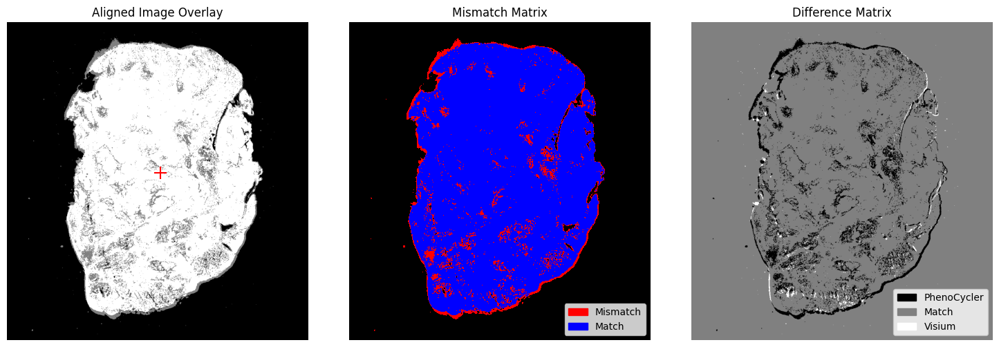

In [48]:
best_ratio2 = res2.sort_values('score').iloc[0]['ratio']
best_shift_term2 = res2.sort_values('score')[['x', 'y']].iloc[0].values

pp_transformed2, diff2 = stepwise_transform(pp_padded, best_ratio2, center_of_mass_visium, best_shift_term2)
plot_alignment(pp_transformed2, hires_mask_cropped)

In [49]:
best_ratio, best_shift_term, best_diff = best_ratio1, best_shift_term1, diff1

<Axes: >

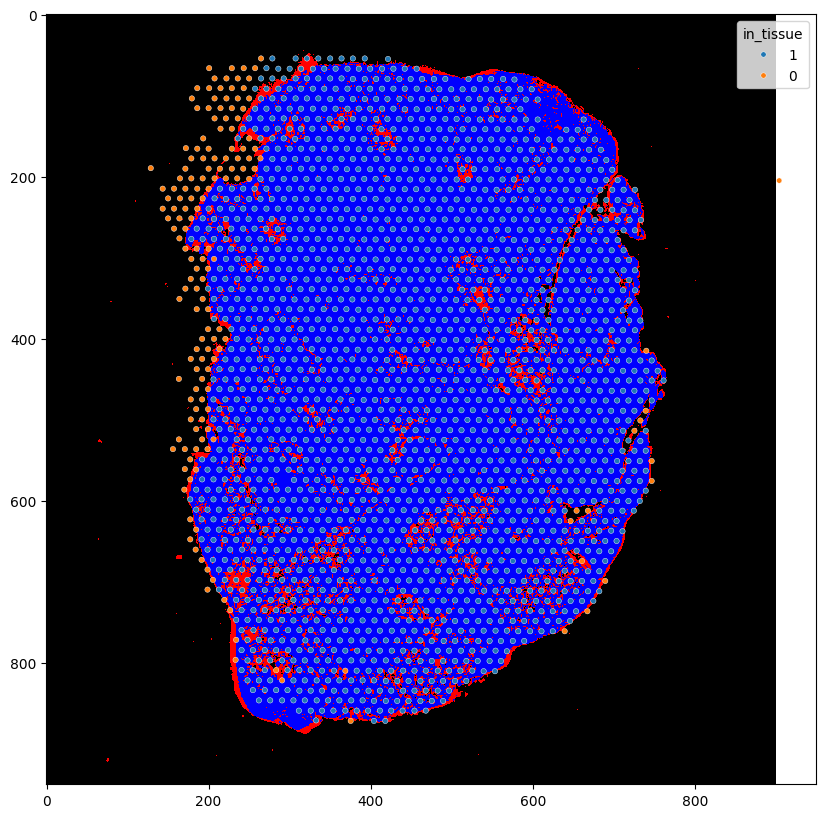

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

colors = ['black', 'red', 'blue']
mismatch_cmap = ListedColormap(colors)

sm = pp_transformed1.astype(int) + hires_mask_cropped.astype(int)
ax.imshow(sm, cmap=mismatch_cmap)
sns.scatterplot(x=(spot_x - x1), y=(spot_y - y1), ax = ax, s=spot_diam, alpha=1, hue=adata.obs['in_tissue'])

# Alignment Backtracing

PP cell coordinate extraction

In [51]:
pp_coords = pd.read_csv(Path(f'{data_dir}/phenocycler_data/meta.csv'), index_col=0)
pp_coords = pp_coords.rename(columns={'X.X': 'y', 'Y.Y': 'x'})
cellid2celltype = pp_coords['Merged.clustering'].to_dict()

Sanity check: Extracted cell coordinates map well on the grayscale PP image

<Axes: xlabel='x', ylabel='y'>

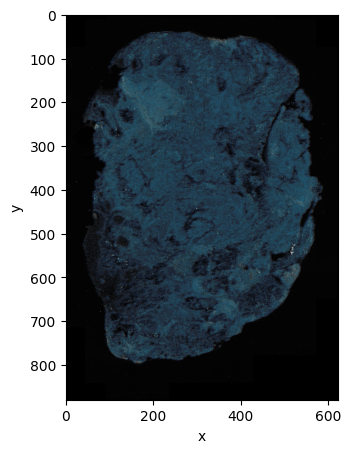

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(pp_cropped_gray, cmap='gray')
sns.scatterplot(y=pp_coords['y'] / block_size, x=(pp_cropped.shape[1] - pp_coords['x']) / block_size, s=1, alpha=0.05, ax=ax)

Applying identified transformation to PP cell coordinates

In [53]:
pp_coords_transformed = pp_coords[['y', 'x']].copy()
pp_coords_transformed['x'] = pp_cropped.shape[1] - pp_coords_transformed['x']
pp_coords_transformed = pp_coords_transformed / block_size / best_ratio - best_diff

Sanity check: transformed PP cell coordianates map well on Visium image

<Axes: xlabel='x', ylabel='y'>

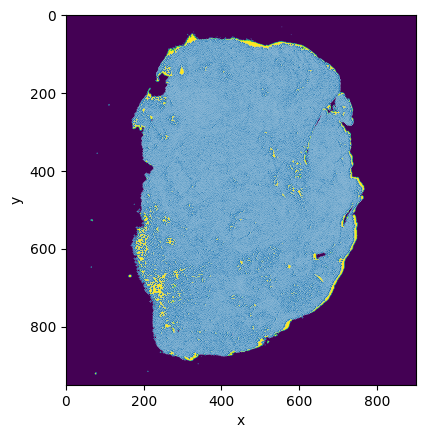

In [54]:
plt.imshow(hires_mask_cropped)
sns.scatterplot(y=pp_coords_transformed['y'], x=pp_coords_transformed['x'], s=1)

## Spot mapping

Here we match the cell level PP measurements to the nearest Visium spots:

In [94]:
adata_full = sc.read_visium(vis_dir, count_file='raw/raw_feature_bc_matrix.h5', library_id=None, load_images=True, source_image_path=os.path.join(vis_dir, 'spatial/tissue_hires_image.png'))

spot_coords = pd.DataFrame(adata_full.obsm['spatial'], columns=['x', 'y'], index=adata_full.obs.index)
spot_coords['in_tissue'] = adata_full.obs['in_tissue']
spot_coords['in_tissue'] = spot_coords['in_tissue'].astype(int)

# Convert 'x' and 'y' columns to float
spot_coords['x'] = spot_coords['x'].astype(float)
spot_coords['y'] = spot_coords['y'].astype(float)

# Apply transformation
spot_coords_transformed = spot_coords.copy()
spot_coords_transformed[['x', 'y']] = spot_coords[['x', 'y']] * sf - np.array([x1, y1])

PP cell coordiantes and Visium spot overlay:

<Axes: xlabel='x', ylabel='y'>

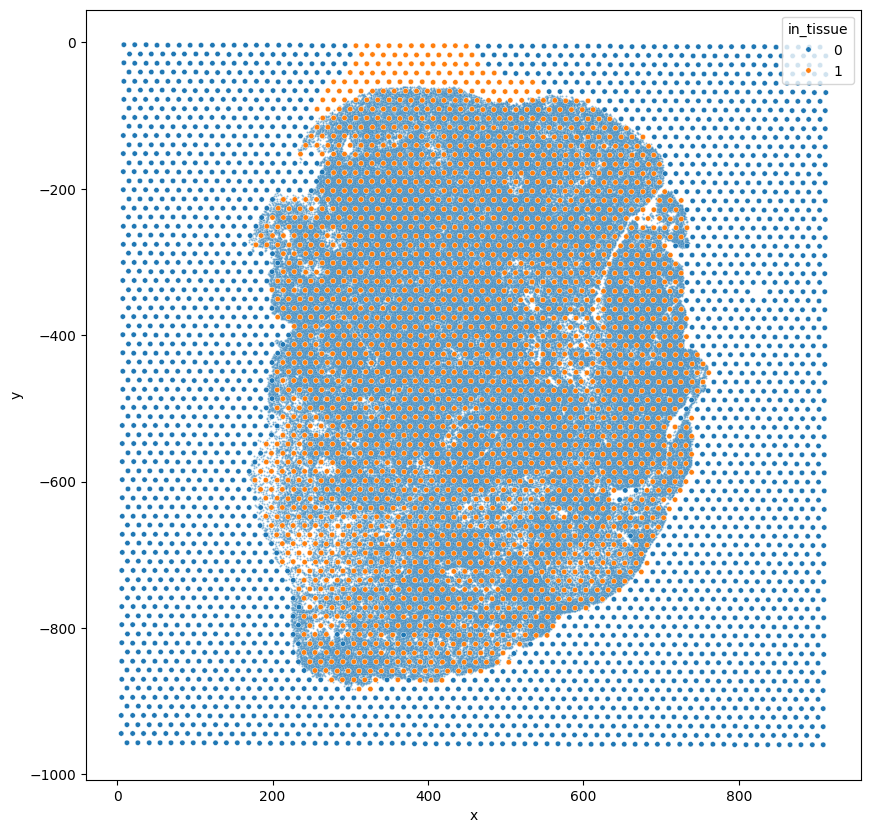

In [95]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

sns.scatterplot(x=pp_coords_transformed['x'], y=-pp_coords_transformed['y'], s=2, alpha=0.5, ax=ax)
sns.scatterplot(x=spot_coords_transformed['x'], y=-spot_coords_transformed['y'], ax = ax, s=spot_diam, alpha=1, hue=spot_coords_transformed['in_tissue'])

In [96]:
spot_coords_transformed['in_tissue']

AACACCTACTATCGAA-1    0
AACACGTGCATCGCAC-1    0
AACACTTGGCAAGGAA-1    1
AACAGGAAGAGCATAG-1    0
AACAGGATTCATAGTT-1    1
                     ..
TGTTGGAACGAGGTCA-1    1
TGTTGGAAGCTCGGTA-1    0
TGTTGGATGGACTTCT-1    1
TGTTGGCCAGACCTAC-1    1
TGTTGGCCTACACGTG-1    0
Name: in_tissue, Length: 4991, dtype: int64

In [97]:
pp_coords_transformed['x']

cellID
zyn-93142.1         168.735555
zyn-93142.3         169.528574
zyn-93142.4         169.672759
zyn-93142.5         169.961129
zyn-93142.6         170.033222
                       ...    
zyn-93142.221167    759.029617
zyn-93142.221168    759.029617
zyn-93142.221170    759.029617
zyn-93142.221172    759.462172
zyn-93142.221173    759.534265
Name: x, Length: 207681, dtype: float64

In [98]:
spot_coords_transformed['y']

AACACCTACTATCGAA-1      6.666692
AACACGTGCATCGCAC-1    944.666739
AACACTTGGCAAGGAA-1    586.666721
AACAGGAAGAGCATAG-1    857.333401
AACAGGATTCATAGTT-1    610.666722
                         ...    
TGTTGGAACGAGGTCA-1    352.000043
TGTTGGAAGCTCGGTA-1     18.000026
TGTTGGATGGACTTCT-1    166.000033
TGTTGGCCAGACCTAC-1    611.333389
TGTTGGCCTACACGTG-1    464.666715
Name: y, Length: 4991, dtype: float64

In [99]:
spot_coords_transformed['in_tissue']

AACACCTACTATCGAA-1    0
AACACGTGCATCGCAC-1    0
AACACTTGGCAAGGAA-1    1
AACAGGAAGAGCATAG-1    0
AACAGGATTCATAGTT-1    1
                     ..
TGTTGGAACGAGGTCA-1    1
TGTTGGAAGCTCGGTA-1    0
TGTTGGATGGACTTCT-1    1
TGTTGGCCAGACCTAC-1    1
TGTTGGCCTACACGTG-1    0
Name: in_tissue, Length: 4991, dtype: int64

In [100]:
spot_coords_transformed['in_tissue'] == 1.

AACACCTACTATCGAA-1    False
AACACGTGCATCGCAC-1    False
AACACTTGGCAAGGAA-1     True
AACAGGAAGAGCATAG-1    False
AACAGGATTCATAGTT-1     True
                      ...  
TGTTGGAACGAGGTCA-1     True
TGTTGGAAGCTCGGTA-1    False
TGTTGGATGGACTTCT-1     True
TGTTGGCCAGACCTAC-1     True
TGTTGGCCTACACGTG-1    False
Name: in_tissue, Length: 4991, dtype: bool

In [101]:
from scipy.spatial.distance import cdist

spot_coords_transformed = spot_coords_transformed.loc[spot_coords_transformed['in_tissue'] == 1.].drop(columns=['in_tissue'])

distances = cdist(pp_coords_transformed[['x', 'y']], spot_coords_transformed[['x', 'y']])
closest_spot_index = np.argmin(distances, axis=1)

pp_coords_transformed['closest_spot_id'] = spot_coords_transformed.index[closest_spot_index]
pp_coords_transformed.head()

unmatched_spots = set(spot_coords_transformed.index) - set(pp_coords_transformed.closest_spot_id.value_counts().index)
matched_spot_ids = [x for x in spot_coords_transformed.index if x not in unmatched_spots]
matched_spot_ids

from collections import defaultdict

spotid2cellnum = defaultdict(int)
spotid2cellnum.update(pp_coords_transformed.closest_spot_id.value_counts().loc[matched_spot_ids].to_dict())

Distribution of the number of cells matched to each spot

<Axes: xlabel='count', ylabel='Density'>

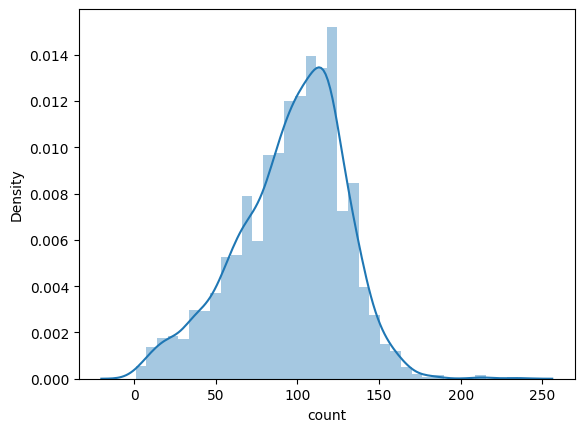

In [102]:
sns.distplot(pp_coords_transformed.closest_spot_id.value_counts())

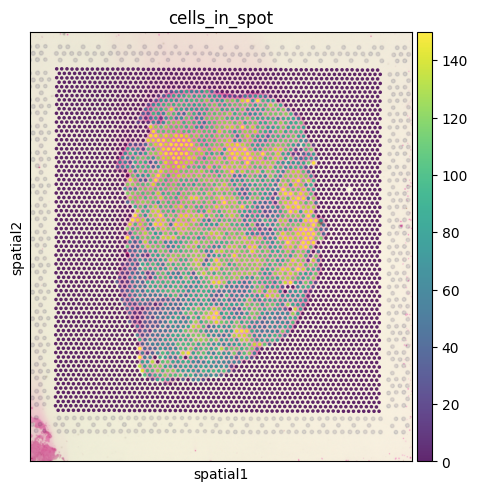

In [107]:
adata_full.obs['cells_in_spot'] = adata_full.obs.index.map(spotid2cellnum)
spatial_coords = adata_full.obsm['spatial']
adata_full.obsm['spatial'] = spatial_coords.astype(float)

sq.pl.spatial_scatter(adata_full, alpha=.85, color=["cells_in_spot"], vmax=150, crop_coord=[(200, 600, 1800, 2400)], 
                      scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"})

## Spot aggregation

Here we aggregate the cell-level PP measurements to the Visium spots, using the mean and sum of the PP signal as aggregation statistics.

In [109]:
pp_expr = pd.read_csv(Path(f'{data_dir}/Phenocycler_data/expr.csv'), index_col=0)
pp_expr.head()

,CD4,PD-1,IFNg,Granzyme B,CD14,Pan-Cytokeratin,Ki67,CD11c,CD8,CD68,...,XCR1,OX40,FoxP3,MPO,CD163,CD21,LAG3,HLA-DR,CD20,CXCR5
zyn-93142.1,42.170,64.104,8.900,0.180,0.210,2641.846,0.000,13.526,0.452,80.384,...,138.350,15.712,51.800,202.844,2.378,0.140,303.428,52.448,8.840,196.032
zyn-93142.3,333.012,200.905,28.858,0.000,0.169,3564.899,0.269,27.760,3.988,171.322,...,224.121,18.151,67.494,3089.414,2.947,0.311,331.163,224.249,58.033,300.757
zyn-93142.4,51.412,106.004,21.780,0.000,0.034,4875.111,0.007,17.649,0.292,106.025,...,295.079,26.335,59.901,256.624,6.642,0.213,286.864,69.332,12.247,246.104
zyn-93142.5,70.839,89.232,20.233,0.007,0.589,2495.480,0.051,22.705,0.231,126.865,...,261.611,48.359,63.632,253.317,11.729,0.551,321.661,72.348,9.639,268.008
zyn-93142.6,30.243,66.937,17.968,0.000,0.268,3420.964,0.533,20.392,0.226,176.234,...,104.139,9.956,55.134,117.399,0.109,0.173,265.637,42.871,3.618,135.650


In [110]:
pp_coords_transformed['celltype'] = pp_coords_transformed.index.map(cellid2celltype)

Pseudo-spot "deconvolution": Grouping cells by 'closest_spot_id' and finding the most frequent cell types as well as calculating the number of each cell type for each spot

In [111]:
most_frequent_celltype = pp_coords_transformed.groupby('closest_spot_id')['celltype'].agg(lambda x: x.mode().iloc[0])

celltype_decon = pd.DataFrame([], index=most_frequent_celltype.index)
celltype_decon['most_frequent_celltype'] = most_frequent_celltype

for ct in celltype_decon['most_frequent_celltype'].unique():
    celltype_decon[f'{ct}_number'] = pp_coords_transformed.groupby('closest_spot_id')['celltype'].agg(lambda x: (x == ct).sum())

# Uncomment the following line to save the results to a CSV file
# celltype_decon.to_csv(Path(f'{output_dir}\\pseudospots_decon.csv'))

In [112]:
celltype_decon

,most_frequent_celltype,mo-DCs_number,Epithelial cells_number,Macrophages_number,Tumor cells 4_number,Neutrophils_number,Tumor cells 1_number,Plasma cells_number,Tumor cell 2_number,Tumor cell 3_number,Endothelial cells_number,CD8+ T cells_number,Helper T cells_number,Tregs_number,Possible B cells_number
closest_spot_id,,,,,,,,,,,,,,,
AACACTTGGCAAGGAA-1,mo-DCs,46,0,3,2,0,4,5,3,40,4,3,0,9,2
AACAGGATTCATAGTT-1,mo-DCs,28,1,15,10,0,0,1,2,0,14,2,0,3,3
AACAGGTTATTGCACC-1,Epithelial cells,0,15,0,0,7,0,0,0,0,0,0,0,0,0
AACAGGTTCACCGAAG-1,Macrophages,2,10,27,0,7,0,5,0,0,5,2,0,0,0
AACATCTAATGACCGG-1,Macrophages,5,0,20,0,14,1,2,0,0,12,3,2,10,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTGCGTCCAAGATT-1,Macrophages,0,1,21,0,0,0,0,0,0,14,0,2,3,1
TGTTGGAACCTTCCGC-1,Tumor cells 4,14,0,15,37,2,0,10,1,0,15,7,6,6,1
TGTTGGAACGAGGTCA-1,Endothelial cells,3,0,14,0,5,6,8,0,0,24,0,2,3,3


In [113]:
pp_expr['pseudospot_barcode'] = pp_coords_transformed['closest_spot_id']
pp_expr_pseudospots_mean = pp_expr.groupby('pseudospot_barcode').mean()
pp_expr_pseudospots_sum = pp_expr.groupby('pseudospot_barcode').sum()
pp_expr_pseudospots_mean.head()

,CD4,PD-1,IFNg,Granzyme B,CD14,Pan-Cytokeratin,Ki67,CD11c,CD8,CD68,...,XCR1,OX40,FoxP3,MPO,CD163,CD21,LAG3,HLA-DR,CD20,CXCR5
pseudospot_barcode,,,,,,,,,,,,,,,,,,,,,
AACACTTGGCAAGGAA-1,381.358516,170.157073,113.637895,1.080218,91.879532,384.130968,124.017444,59.077879,6.082823,198.372774,...,383.613145,66.164121,162.316540,348.046032,79.497718,2.756742,277.808266,574.568444,10.487903,416.328210
AACAGGATTCATAGTT-1,328.189487,119.345825,67.960063,6.566775,74.191375,245.198888,49.524025,52.372388,6.564725,213.051400,...,209.357400,33.500425,92.668925,185.980437,95.756950,2.524212,231.963488,1041.542650,7.810850,327.203762
AACAGGTTATTGCACC-1,39.392091,62.822182,12.763455,0.018545,4.610409,987.488682,2.628136,7.924409,0.781500,289.313909,...,113.032000,11.186682,44.700091,977.543773,2.273773,0.329136,195.251045,83.915000,10.844864,157.711364
AACAGGTTCACCGAAG-1,305.633661,108.832051,113.101085,7.106949,76.340814,178.166068,34.511729,36.260525,12.918390,193.501508,...,157.781153,27.650814,66.041017,453.470271,32.135424,0.907305,235.227000,245.346983,8.927559,281.566288
AACATCTAATGACCGG-1,305.040306,105.373500,66.457472,4.886764,28.006708,131.353903,34.951000,11.067236,6.736306,439.447139,...,255.451306,36.026944,130.230931,1257.226958,72.568931,0.421639,185.020889,454.118931,10.882514,336.001694


In [121]:
# Uncomment the following line to save the results to a CSV file
#pp_expr_pseudospots_sum.to_csv(Path(f'{output_dir}/pseudospots_sum.csv'))
#pp_expr_pseudospots_mean.to_csv(Path(f'{output_dir}/pseudospots_mean.csv'))

Adding the aggregation results to Adata Object

In [115]:
for prot in pp_expr_pseudospots_mean.columns:
    spotid2prot = defaultdict(int)
    spotid2prot.update(pp_expr_pseudospots_mean[prot].to_dict())

    spotid2prot_sum = defaultdict(int)
    spotid2prot_sum.update(pp_expr_pseudospots_sum[prot].to_dict())

    adata.obs['_'.join(['pseudospot_mean', prot])] = adata.obs.index.map(spotid2prot)
    adata.obs['_'.join(['pseudospot_sum', prot])] = adata.obs.index.map(spotid2prot_sum)

    adata_full.obs['_'.join(['pseudospot_mean', prot])] = adata_full.obs.index.map(spotid2prot)
    adata_full.obs['_'.join(['pseudospot_sum', prot])] = adata_full.obs.index.map(spotid2prot_sum)

In [124]:
adata_full.write_h5ad(Path(f'{output_dir}/adata_with_pseudospots.h5ad'))

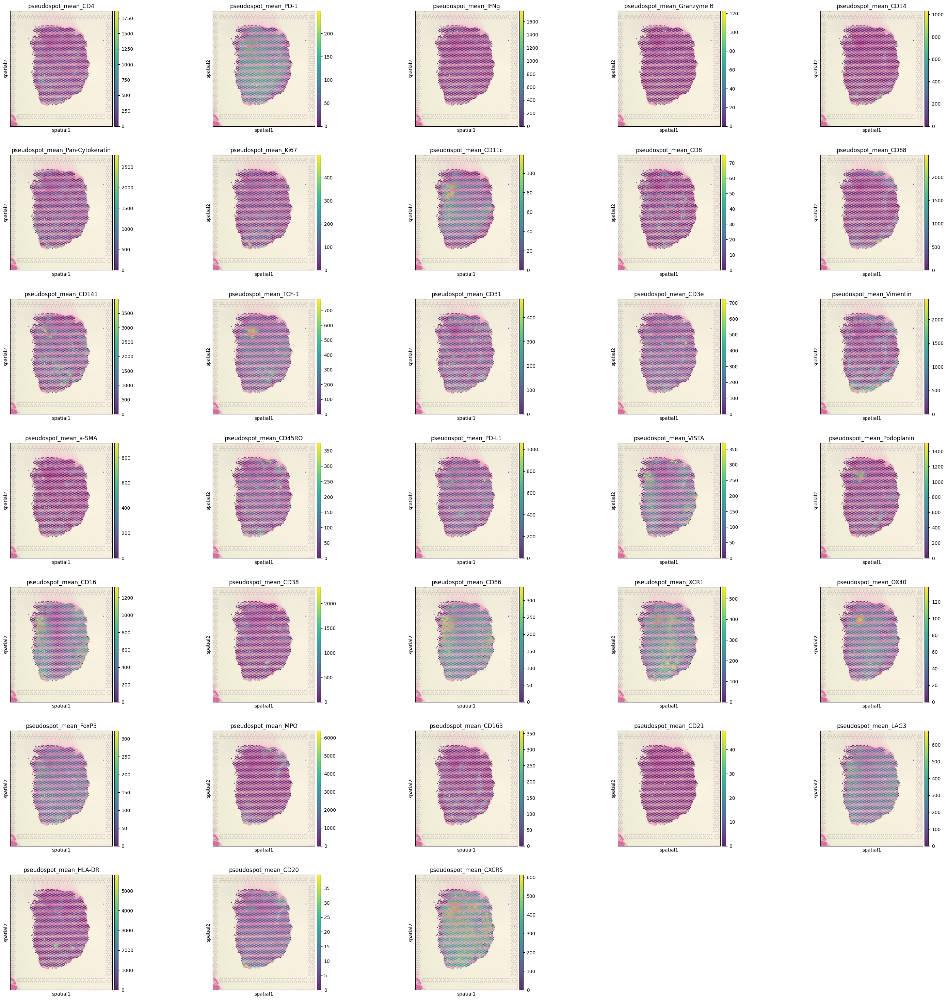

In [117]:
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
sq.pl.spatial_scatter(adata, alpha=.85, color=list(adata.obs.columns[adata.obs.columns.str.startswith('pseudospot_mean')]), crop_coord=[(200, 600, 1800, 2400)], 
                        scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"}, ncols=5)

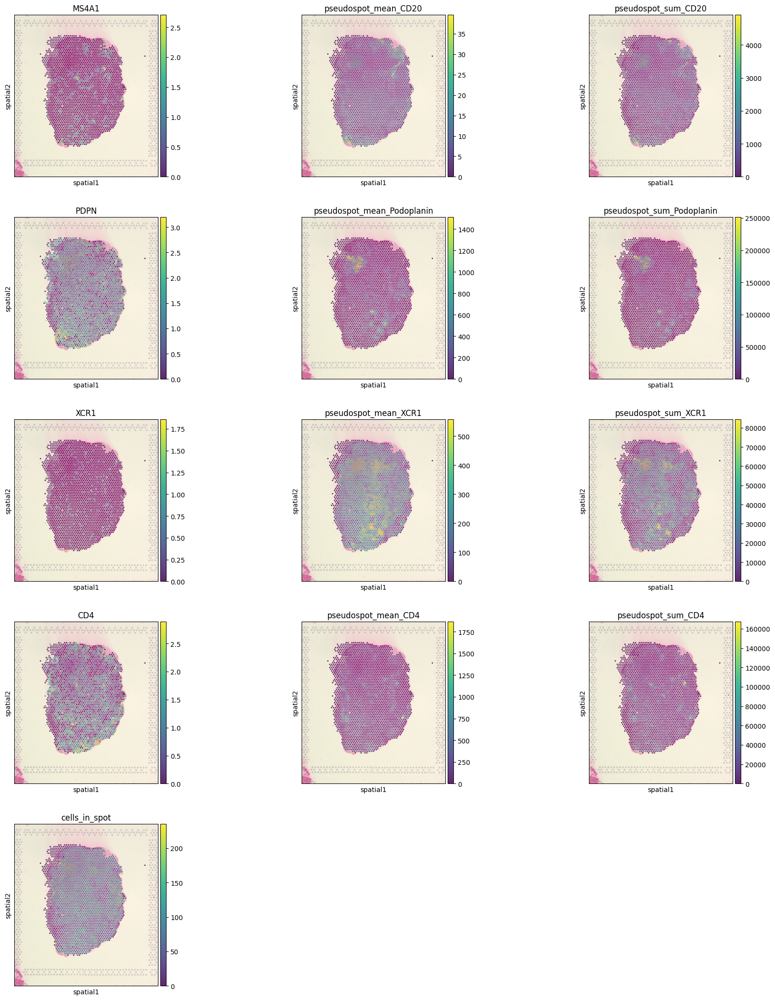

In [118]:
sq.pl.spatial_scatter(adata, alpha=.85, color=['MS4A1', 'pseudospot_mean_CD20', 'pseudospot_sum_CD20', 
                                               'PDPN', 'pseudospot_mean_Podoplanin', 'pseudospot_sum_Podoplanin',
                                               'XCR1', 'pseudospot_mean_XCR1', 'pseudospot_sum_XCR1',
                                               'CD4', 'pseudospot_mean_CD4', 'pseudospot_sum_CD4',
                                               'cells_in_spot'
                                               ], crop_coord=[(200, 600, 1800, 2400)], 
                        scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"}, ncols=3)